## Cell 1 — Setup & imports

In [1]:
# Cell 1 - Setup & imports
import warnings
warnings.filterwarnings("ignore")
import os
import random
from pathlib import Path
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from tqdm.auto import tqdm

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torch.cuda.amp import GradScaler, autocast
import torchvision.transforms as T

from sklearn.model_selection import StratifiedKFold, train_test_split
from sklearn.metrics import confusion_matrix, classification_report, roc_auc_score, roc_curve, auc

# Optional libs (Kaggle usually has these; uncomment install if missing)
# !pip install timm albumentations torchmetrics

import timm
import albumentations as A
from albumentations.pytorch import ToTensorV2

# Reproducibility
SEED = 42
def seed_everything(seed=SEED):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
seed_everything()

# Paths (from your message)
CSV_PATH = "/kaggle/input/aptos2019-blindness-detection/train.csv"
IMG_DIR = "/kaggle/input/aptos2019-blindness-detection/train_images"
OUT_DIR = Path("/kaggle/working/dr_outputs")
OUT_DIR.mkdir(exist_ok=True, parents=True)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


Device: cuda


## Cell 2 — Load CSV, build paths, show sample

        id_code  diagnosis                                         image_path
0  000c1434d8d7          2  /kaggle/input/aptos2019-blindness-detection/tr...
1  001639a390f0          4  /kaggle/input/aptos2019-blindness-detection/tr...
2  0024cdab0c1e          1  /kaggle/input/aptos2019-blindness-detection/tr...
3  002c21358ce6          0  /kaggle/input/aptos2019-blindness-detection/tr...
4  005b95c28852          0  /kaggle/input/aptos2019-blindness-detection/tr...


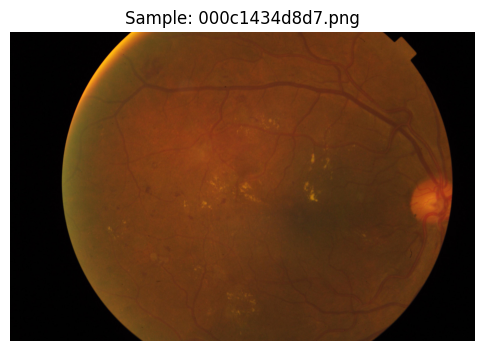

Saved:  /kaggle/working/dr_outputs/sample_original.png


In [2]:
# Cell 2 - Load csv and create image paths
df = pd.read_csv(CSV_PATH)
# Typical APTOS uses id_code column, if file names include extension add .png
if 'id_code' in df.columns:
    df['image_path'] = df['id_code'].astype(str) + '.png'
    df['image_path'] = df['image_path'].apply(lambda x: os.path.join(IMG_DIR, x))
else:
    # fallback: assume 'image_path' column exists
    if 'image_path' not in df.columns:
        raise ValueError("CSV missing 'id_code' and 'image_path' columns; adjust this cell accordingly.")
print(df.head())

# quick sample display (will be saved)
sample_p = df.loc[0, 'image_path']
img_bgr = cv2.imread(sample_p)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(6,6))
plt.imshow(img_rgb)
plt.title(f"Sample: {Path(sample_p).name}")
plt.axis('off')
plt.savefig(OUT_DIR / "sample_original.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved: ", OUT_DIR / "sample_original.png")


## Cell 3 — Preprocessing functions

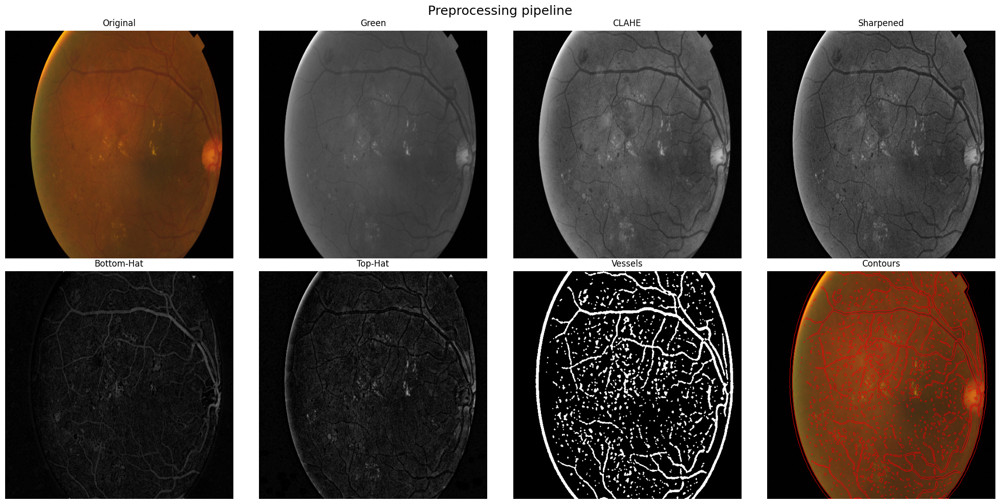

Saved: /kaggle/working/dr_outputs/preprocessing_pipeline.png


In [3]:
# Cell 3 - Preprocessing functions (your pipeline with small fixes)
def extract_green_channel(img):
    return img[:, :, 1]

def clahe_enhance(img):
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    return clahe.apply(img)

def sharpen(img):
    blur = cv2.GaussianBlur(img, (0,0), sigmaX=3)
    sharp = cv2.addWeighted(img, 1.5, blur, -0.5, 0)
    return sharp

def top_hat_transform(img, kernel_size=15):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    return cv2.morphologyEx(img, cv2.MORPH_TOPHAT, kernel)

def bottom_hat_transform(img, kernel_size=15):
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    return cv2.morphologyEx(img, cv2.MORPH_BLACKHAT, kernel)

def vessel_segmentation(img, clahe_flag=True):
    if clahe_flag:
        img = clahe_enhance(img)
    blurred = cv2.GaussianBlur(img, (5,5), 0)
    vessels_mask = cv2.adaptiveThreshold(
        blurred, 255, cv2.ADAPTIVE_THRESH_MEAN_C,
        cv2.THRESH_BINARY_INV, 15, 10
    )
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (3,3))
    vessels_mask = cv2.morphologyEx(vessels_mask, cv2.MORPH_OPEN, kernel, iterations=1)
    return vessels_mask

def enhance_contours(rgb_img, mask):
    contours, _ = cv2.findContours(mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    img_contour = rgb_img.copy()
    cv2.drawContours(img_contour, contours, -1, (255,0,0), 1)
    return img_contour

# A wrapper that returns multiple processing stages (useful to save figures)
def preprocess_for_visualization(path, size=(256,256)):
    bgr = cv2.imread(path)
    rgb = cv2.cvtColor(bgr, cv2.COLOR_BGR2RGB)
    rgb = cv2.resize(rgb, size)
    green = extract_green_channel(rgb)
    hist = clahe_enhance(green)
    sharp = sharpen(hist)
    bottom = bottom_hat_transform(sharp, kernel_size=15)
    top = top_hat_transform(sharp, kernel_size=15)
    vessels = vessel_segmentation(sharp, clahe_flag=True)
    contour = enhance_contours(rgb, vessels)
    # Return everything in RGB/gray as needed
    return {
        'orig': rgb,
        'green': green,
        'hist': hist,
        'sharp': sharp,
        'bottom': bottom,
        'top': top,
        'vessels': vessels,
        'contour': contour
    }

# Save the preprocessing pipeline figure for the sample image
stages = preprocess_for_visualization(sample_p, size=(512,512))
fig, axes = plt.subplots(2,4, figsize=(20,10))
titles = ['Original', 'Green', 'CLAHE', 'Sharpened', 'Bottom-Hat', 'Top-Hat', 'Vessels', 'Contours']
imgs = [stages['orig'], stages['green'], stages['hist'], stages['sharp'],
        stages['bottom'], stages['top'], stages['vessels'], stages['contour']]
for ax, im, t in zip(axes.flatten(), imgs, titles):
    if im.ndim == 2:
        ax.imshow(im, cmap='gray')
    else:
        ax.imshow(im)
    ax.set_title(t)
    ax.axis('off')
plt.suptitle("Preprocessing pipeline", fontsize=18)
plt.tight_layout()
plt.savefig(OUT_DIR / "preprocessing_pipeline.png", dpi=300, bbox_inches='tight')
plt.show()
print("Saved:", OUT_DIR / "preprocessing_pipeline.png")


## Cell 4 — Albumentations transforms & Dataset class

In [4]:
# Cell 4 - Robust Albumentations transforms (auto-detects version) + Dataset
import albumentations as A
from albumentations.pytorch import ToTensorV2
from torch.utils.data import Dataset, DataLoader
import torch
import cv2
import numpy as np

print("Albumentations version:", getattr(A, "__version__", "unknown"))

# Use an integer IMG_SIZE (preferred) and also a tuple
IMG_SIZE = 384
IMG_SIZE_TUPLE = (IMG_SIZE, IMG_SIZE)
BATCH_SIZE = 16

def make_train_transforms():
    """
    Create train transforms in a way that works across albumentations versions.
    Tries RandomResizedCrop with the syntax the version expects; if that raises,
    falls back to RandomCrop + Resize (deterministic safe alternative).
    """
    # Common augmentation list (without RandomResizedCrop)
    base = [
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.1),
        A.RandomBrightnessContrast(p=0.5),
        A.ShiftScaleRotate(shift_limit=0.05, scale_limit=0.1, rotate_limit=15, p=0.5),
    ]

    # Try to create RandomResizedCrop in a version-tolerant way
    try:
        # First try v2.x style (size=tuple)
        tr = [A.RandomResizedCrop(size=IMG_SIZE_TUPLE, scale=(0.7, 1.0), p=1.0)] + base + [
            A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
            ToTensorV2()
        ]
        _ = A.Compose(tr)  # test construction
        print("Using RandomResizedCrop(size=tuple) syntax.")
        return A.Compose(tr)
    except Exception as e1:
        try:
            # Try v1.x style (height=int, width=int)
            tr = [A.RandomResizedCrop(height=IMG_SIZE, width=IMG_SIZE, scale=(0.7, 1.0), p=1.0)] + base + [
                A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
                ToTensorV2()
            ]
            _ = A.Compose(tr)
            print("Using RandomResizedCrop(height=..., width=...) syntax.")
            return A.Compose(tr)
        except Exception as e2:
            # Final safe fallback: RandomCrop + Resize (should always exist)
            print("RandomResizedCrop failed for both syntaxes. Falling back to RandomCrop + Resize.")
            tr = [
                A.RandomCrop(height=int(IMG_SIZE*0.9), width=int(IMG_SIZE*0.9), p=1.0),
                A.Resize(height=IMG_SIZE, width=IMG_SIZE),
            ] + base + [
                A.Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225)),
                ToTensorV2()
            ]
            return A.Compose(tr)

def make_valid_transforms():
    # Create validation transforms similarly, tolerant to Resize signatures
    try:
        # v2.x style
        val = [A.Resize(size=IMG_SIZE_TUPLE), A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)), ToTensorV2()]
        _ = A.Compose(val)
        print("Using Resize(size=tuple) for validation.")
        return A.Compose(val)
    except Exception:
        # v1.x style
        val = [A.Resize(height=IMG_SIZE, width=IMG_SIZE), A.Normalize(mean=(0.485,0.456,0.406), std=(0.229,0.224,0.225)), ToTensorV2()]
        print("Using Resize(height=..., width=...) for validation.")
        return A.Compose(val)

train_transforms = make_train_transforms()
valid_transforms = make_valid_transforms()

# --- PyTorch Dataset ---
class DRDataset(Dataset):
    def __init__(self, df, transforms=None):
        self.df = df.reset_index(drop=True)
        self.transforms = transforms

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        img_path = row['image_path']
        img = cv2.imread(img_path)
        if img is None:
            # handle missing file gracefully
            # return a black image so DataLoader doesn't crash; also print a warning
            print(f"Warning: could not read image {img_path}")
            img = np.zeros((IMG_SIZE, IMG_SIZE, 3), dtype=np.uint8)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        if self.transforms:
            augmented = self.transforms(image=img)
            img = augmented['image']

        label = int(row['diagnosis'])  # assuming 0..4
        return img, label

# --- Sanity Check (small sample) ---
tmp_df = df.sample(n=8, random_state=42).copy()
ds = DRDataset(tmp_df, transforms=valid_transforms)
dl = DataLoader(ds, batch_size=4, shuffle=False)
imgs, labels = next(iter(dl))

print("Batch shapes:", imgs.shape)
print("Labels:", labels)


Albumentations version: 2.0.8
Using RandomResizedCrop(size=tuple) syntax.
Using Resize(height=..., width=...) for validation.
Batch shapes: torch.Size([4, 3, 384, 384])
Labels: tensor([0, 1, 3, 4])


## Cell 5 — Model: EfficientNet backbone + Transformer encoder (ViT-like head)

In [5]:
# Cell 5 - Model definition (EfficientNet backbone + lightweight Transformer head)
import torch
import torch.nn as nn
import timm

class EffNetVit(nn.Module):
    def __init__(self, backbone_name='tf_efficientnet_b3_ns', pretrained=True,
                 num_classes=5, hidden_dim=512, n_heads=8, n_layers=3,
                 dropout=0.1):
        super().__init__()
        self.backbone = timm.create_model(backbone_name, pretrained=pretrained, features_only=True)
        c_out = self.backbone.feature_info.channels()[-1]
        self.proj = nn.Conv2d(c_out, hidden_dim, kernel_size=1)
        encoder_layer = nn.TransformerEncoderLayer(
            d_model=hidden_dim, nhead=n_heads,
            dim_feedforward=hidden_dim * 4, dropout=dropout, activation='gelu'
        )
        self.transformer = nn.TransformerEncoder(encoder_layer, num_layers=n_layers)
        self.cls_head = nn.Sequential(nn.LayerNorm(hidden_dim), nn.Linear(hidden_dim, num_classes))
        self.dropout = nn.Dropout(dropout)
        self.pos_enc = None

    def forward(self, x):
        feats = self.backbone(x)
        last = feats[-1]  # [B, C, H, W]
        proj = self.proj(last)
        B, C, H, W = proj.shape
        seq = proj.flatten(2).permute(2, 0, 1)  # [S, B, C]
        if self.pos_enc is None or self.pos_enc.shape[0] != seq.shape[0]:
            self.pos_enc = nn.Parameter(torch.zeros(seq.shape[0], 1, C, device=seq.device))
            nn.init.trunc_normal_(self.pos_enc, std=0.02)
        seq = seq + self.pos_enc
        enc = self.transformer(seq)
        pooled = enc.mean(dim=0)
        out = self.dropout(pooled)
        return self.cls_head(out)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = EffNetVit(backbone_name='tf_efficientnet_b3_ns', pretrained=True, num_classes=5).to(device)
print(f"Model initialized on {device}")


model.safetensors:   0%|          | 0.00/49.3M [00:00<?, ?B/s]

Model initialized on cuda


## Cell 6 — Loss, optimizer, scheduler, helpers

In [6]:
# Cell 6 - Loss, optimizer, scheduler, helpers
import torch.nn.functional as F
from torch.cuda.amp import autocast, GradScaler
from tqdm import tqdm
from pathlib import Path

OUT_DIR = Path("./checkpoints")
OUT_DIR.mkdir(parents=True, exist_ok=True)

NUM_EPOCHS = 12
LEARNING_RATE = 2e-4
WEIGHT_DECAY = 1e-5
SEED = 42

# Handle class imbalance
class_counts = df['diagnosis'].value_counts().sort_index().values
print("Class counts:", class_counts)
class_weights = 1.0 / (class_counts + 1e-6)
class_weights = class_weights / class_weights.sum() * len(class_counts)
class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
print("Class weights:", class_weights)

criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS)
scaler = GradScaler()

def train_one_epoch(model, loader, optimizer, criterion, device, scaler):
    model.train()
    total_loss, correct, total = 0, 0, 0
    for imgs, labels in tqdm(loader, desc="Train", leave=False):
        imgs, labels = imgs.to(device).float(), labels.to(device)
        optimizer.zero_grad()
        with torch.amp.autocast("cuda"):
            logits = model(imgs)
            loss = criterion(logits, labels)
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()
        total_loss += loss.item() * imgs.size(0)
        correct += (logits.argmax(1) == labels).sum().item()
        total += imgs.size(0)
    return total_loss / total, correct / total

def valid_one_epoch(model, loader, criterion, device):
    model.eval()
    total_loss, correct, total = 0, 0, 0
    all_labels, all_probs = [], []
    with torch.no_grad():
        for imgs, labels in tqdm(loader, desc="Valid", leave=False):
            imgs, labels = imgs.to(device).float(), labels.to(device)
            with torch.amp.autocast("cuda"):
                logits = model(imgs)
                loss = criterion(logits, labels)
            total_loss += loss.item() * imgs.size(0)
            probs = F.softmax(logits, dim=1)
            preds = probs.argmax(1)
            correct += (preds == labels).sum().item()
            total += imgs.size(0)
            all_labels.append(labels.cpu().numpy())
            all_probs.append(probs.cpu().numpy())
    return (
        total_loss / total,
        correct / total,
        np.concatenate(all_labels),
        np.concatenate(all_probs),
    )


Class counts: [1805  370  999  193  295]
Class weights: tensor([0.2159, 1.0534, 0.3901, 2.0194, 1.3212], device='cuda:0')


## Cell 7 — Prepare folds & dataloaders (Stratified K-Fold) and run training

In [7]:
# Cell 7 - Stratified K-Fold Training
from sklearn.model_selection import StratifiedKFold
import json

N_SPLITS = 5
skf = StratifiedKFold(n_splits=N_SPLITS, shuffle=True, random_state=SEED)
history = {}

for fold_idx, (tr_idx, val_idx) in enumerate(skf.split(df, df['diagnosis'])):
    print(f"\n===== Starting Fold {fold_idx} =====")
    tr_df = df.iloc[tr_idx].reset_index(drop=True)
    va_df = df.iloc[val_idx].reset_index(drop=True)

    train_ds = DRDataset(tr_df, transforms=train_transforms)
    valid_ds = DRDataset(va_df, transforms=valid_transforms)
    train_loader = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=0, pin_memory=True)
    valid_loader = DataLoader(valid_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)

    model = EffNetVit(backbone_name='tf_efficientnet_b3_ns', pretrained=True, num_classes=5).to(device)
    optimizer = torch.optim.AdamW(model.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS)
    scaler = GradScaler()

    best_val_acc = 0.0
    history[fold_idx] = {"train_loss": [], "val_loss": [], "train_acc": [], "val_acc": []}

    for epoch in range(NUM_EPOCHS):
        print(f"\nEpoch {epoch+1}/{NUM_EPOCHS}")
        tr_loss, tr_acc = train_one_epoch(model, train_loader, optimizer, criterion, device, scaler)
        val_loss, val_acc, val_labels, val_probs = valid_one_epoch(model, valid_loader, criterion, device)
        scheduler.step()

        history[fold_idx]["train_loss"].append(tr_loss)
        history[fold_idx]["val_loss"].append(val_loss)
        history[fold_idx]["train_acc"].append(tr_acc)
        history[fold_idx]["val_acc"].append(val_acc)

        print(f"Train loss {tr_loss:.4f}, acc {tr_acc:.4f} | Val loss {val_loss:.4f}, acc {val_acc:.4f}")

        if val_acc > best_val_acc:
            best_val_acc = val_acc
            torch.save(model.state_dict(), OUT_DIR / f"best_model_fold{fold_idx}.pth")
            print("✅ Saved new best model.")

    with open(OUT_DIR / f"history_fold{fold_idx}.json", "w") as f:
        json.dump(history[fold_idx], f)

    print(f"Fold {fold_idx} completed. Best val acc: {best_val_acc:.4f}")



===== Starting Fold 0 =====

Epoch 1/12


Train loss 1.2426, acc 0.6125 | Val loss 0.9184, acc 0.7558
✅ Saved new best model.

Epoch 2/12


Train loss 0.9589, acc 0.7153 | Val loss 0.8499, acc 0.7381

Epoch 3/12


Train loss 0.8695, acc 0.7381 | Val loss 0.9254, acc 0.7422

Epoch 4/12


Train loss 0.7350, acc 0.7808 | Val loss 0.8256, acc 0.7858
✅ Saved new best model.

Epoch 5/12


Train loss 0.6794, acc 0.8132 | Val loss 0.7827, acc 0.8022
✅ Saved new best model.

Epoch 6/12


Train loss 0.5486, acc 0.8494 | Val loss 0.9035, acc 0.7899

Epoch 7/12


Train loss 0.5052, acc 0.8488 | Val loss 0.9748, acc 0.7872

Epoch 8/12


Train loss 0.4285, acc 0.8699 | Val loss 0.8738, acc 0.8049
✅ Saved new best model.

Epoch 9/12


Train loss 0.3278, acc 0.9006 | Val loss 0.9831, acc 0.8186
✅ Saved new best model.

Epoch 10/12


Train loss 0.3025, acc 0.9092 | Val loss 0.9884, acc 0.8131

Epoch 11/12


Train loss 0.2440, acc 0.9293 | Val loss 1.0091, acc 0.8172

Epoch 12/12


Train loss 0.1979, acc 0.9478 | Val loss 1.0488, acc 0.8295
✅ Saved new best model.
Fold 0 completed. Best val acc: 0.8295

===== Starting Fold 1 =====

Epoch 1/12


Train loss 1.2332, acc 0.6302 | Val loss 1.0291, acc 0.6835
✅ Saved new best model.

Epoch 2/12


Train loss 0.9641, acc 0.7033 | Val loss 0.8893, acc 0.6917
✅ Saved new best model.

Epoch 3/12


Train loss 0.8710, acc 0.7289 | Val loss 0.8579, acc 0.7503
✅ Saved new best model.

Epoch 4/12


Train loss 0.7870, acc 0.7692 | Val loss 0.9069, acc 0.7872
✅ Saved new best model.

Epoch 5/12


Train loss 0.6874, acc 0.7999 | Val loss 0.9608, acc 0.7681

Epoch 6/12


Train loss 0.6223, acc 0.8272 | Val loss 0.8501, acc 0.7981
✅ Saved new best model.

Epoch 7/12


Train loss 0.5408, acc 0.8481 | Val loss 0.8422, acc 0.8172
✅ Saved new best model.

Epoch 8/12


Train loss 0.4298, acc 0.8723 | Val loss 0.9157, acc 0.8363
✅ Saved new best model.

Epoch 9/12


Train loss 0.3520, acc 0.8942 | Val loss 0.9506, acc 0.8322

Epoch 10/12


Train loss 0.2607, acc 0.9276 | Val loss 1.0687, acc 0.8063

Epoch 11/12


Train loss 0.2562, acc 0.9263 | Val loss 1.0499, acc 0.8308

Epoch 12/12


Train loss 0.2268, acc 0.9344 | Val loss 1.1669, acc 0.8199
Fold 1 completed. Best val acc: 0.8363

===== Starting Fold 2 =====

Epoch 1/12


Train loss 1.2634, acc 0.5901 | Val loss 0.8028, acc 0.7445
✅ Saved new best model.

Epoch 2/12


Train loss 0.9513, acc 0.7171 | Val loss 0.8377, acc 0.7773
✅ Saved new best model.

Epoch 3/12


Train loss 0.8661, acc 0.7311 | Val loss 0.8206, acc 0.8060
✅ Saved new best model.

Epoch 4/12


Train loss 0.7358, acc 0.7843 | Val loss 0.8751, acc 0.7664

Epoch 5/12


Train loss 0.7286, acc 0.7799 | Val loss 0.8784, acc 0.7596

Epoch 6/12


Train loss 0.6123, acc 0.8215 | Val loss 0.8346, acc 0.8005

Epoch 7/12


Train loss 0.5287, acc 0.8526 | Val loss 0.7504, acc 0.8142
✅ Saved new best model.

Epoch 8/12


Train loss 0.4151, acc 0.8706 | Val loss 0.9035, acc 0.8101

Epoch 9/12


Train loss 0.3817, acc 0.8945 | Val loss 0.9353, acc 0.8374
✅ Saved new best model.

Epoch 10/12


Train loss 0.3032, acc 0.9130 | Val loss 0.9138, acc 0.8169

Epoch 11/12


Train loss 0.2677, acc 0.9239 | Val loss 0.9485, acc 0.8238

Epoch 12/12


Train loss 0.2614, acc 0.9276 | Val loss 0.9819, acc 0.8333
Fold 2 completed. Best val acc: 0.8374

===== Starting Fold 3 =====

Epoch 1/12


Train loss 1.2324, acc 0.5993 | Val loss 0.9911, acc 0.6612
✅ Saved new best model.

Epoch 2/12


Train loss 0.9413, acc 0.7154 | Val loss 0.9309, acc 0.8169
✅ Saved new best model.

Epoch 3/12


Train loss 0.8719, acc 0.7311 | Val loss 0.8085, acc 0.8060

Epoch 4/12


Train loss 0.7700, acc 0.7751 | Val loss 0.7899, acc 0.7691

Epoch 5/12


Train loss 0.7083, acc 0.8048 | Val loss 0.7650, acc 0.7801

Epoch 6/12


Train loss 0.6247, acc 0.8212 | Val loss 0.7564, acc 0.8087

Epoch 7/12


Train loss 0.5125, acc 0.8522 | Val loss 0.8224, acc 0.8279
✅ Saved new best model.

Epoch 8/12


Train loss 0.4154, acc 0.8860 | Val loss 0.9562, acc 0.7923

Epoch 9/12


Train loss 0.3613, acc 0.8898 | Val loss 0.8982, acc 0.8005

Epoch 10/12


Train loss 0.2951, acc 0.9154 | Val loss 1.0197, acc 0.8074

Epoch 11/12


Train loss 0.2536, acc 0.9222 | Val loss 0.9965, acc 0.8238

Epoch 12/12


Train loss 0.2299, acc 0.9355 | Val loss 1.0461, acc 0.8169
Fold 3 completed. Best val acc: 0.8279

===== Starting Fold 4 =====

Epoch 1/12


Train loss 1.2519, acc 0.6321 | Val loss 0.8982, acc 0.8074
✅ Saved new best model.

Epoch 2/12


Train loss 0.9222, acc 0.7181 | Val loss 0.9310, acc 0.7787

Epoch 3/12


Train loss 0.7915, acc 0.7645 | Val loss 1.0123, acc 0.8087
✅ Saved new best model.

Epoch 4/12


Train loss 0.7785, acc 0.7802 | Val loss 0.9881, acc 0.8128
✅ Saved new best model.

Epoch 5/12


Train loss 0.7086, acc 0.7973 | Val loss 0.7598, acc 0.8183
✅ Saved new best model.

Epoch 6/12


Train loss 0.5791, acc 0.8389 | Val loss 0.8574, acc 0.8046

Epoch 7/12


Train loss 0.4909, acc 0.8597 | Val loss 0.8330, acc 0.7842

Epoch 8/12


Train loss 0.3988, acc 0.8877 | Val loss 0.8422, acc 0.8265
✅ Saved new best model.

Epoch 9/12


Train loss 0.3525, acc 0.8997 | Val loss 0.8999, acc 0.8292
✅ Saved new best model.

Epoch 10/12


Train loss 0.2705, acc 0.9218 | Val loss 0.9619, acc 0.8415
✅ Saved new best model.

Epoch 11/12


Train loss 0.2348, acc 0.9249 | Val loss 1.0797, acc 0.8251

Epoch 12/12


Train loss 0.1960, acc 0.9396 | Val loss 0.9996, acc 0.8402
Fold 4 completed. Best val acc: 0.8415


## Cell 8 — Training curves & metrics (saved)

In [16]:
# Cell 8 - Ensemble Inference (Average over all folds)
import torch.nn.functional as F
from pathlib import Path

models = []
for fold_idx in range(N_SPLITS):
    model_path = OUT_DIR / f"best_model_fold{fold_idx}.pth"
    if model_path.exists():
        print(f"✅ Loading fold {fold_idx} model...")
        m = EffNetVit(backbone_name='tf_efficientnet_b3_ns', pretrained=False, num_classes=5).to(device)
        
        # Load state dict safely (ignore missing or unexpected keys like pos_enc)
        state_dict = torch.load(model_path, map_location=device)
        missing, unexpected = m.load_state_dict(state_dict, strict=False)
        if unexpected:
            print(f"⚠️ Ignored unexpected keys: {unexpected}")
        if missing:
            print(f"⚠️ Missing keys: {missing}")
            
        m.eval()
        models.append(m)
    else:
        print(f"⚠️ Model for fold {fold_idx} not found at {model_path}")

# Combine all validation sets for evaluation
full_val_df = df.copy()
full_val_ds = DRDataset(full_val_df, transforms=valid_transforms)
full_val_loader = DataLoader(full_val_ds, batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)

all_labels = []
all_probs = []

with torch.no_grad():
    for imgs, labels in tqdm(full_val_loader, desc="Ensembling Folds"):
        imgs = imgs.to(device).float()
        preds_sum = torch.zeros((imgs.size(0), 5), device=device)
        
        for m in models:
            logits = m(imgs)
            preds_sum += F.softmax(logits, dim=1)
        
        avg_probs = preds_sum / len(models)
        all_probs.append(avg_probs.cpu().numpy())
        all_labels.append(labels.numpy())

all_probs = np.concatenate(all_probs)
all_labels = np.concatenate(all_labels)

np.save(OUT_DIR / "ensemble_probs.npy", all_probs)
np.save(OUT_DIR / "ensemble_labels.npy", all_labels)
print("✅ Ensemble predictions saved successfully.")


✅ Loading fold 0 model...
⚠️ Ignored unexpected keys: ['pos_enc']
✅ Loading fold 1 model...
⚠️ Ignored unexpected keys: ['pos_enc']
✅ Loading fold 2 model...
⚠️ Ignored unexpected keys: ['pos_enc']
✅ Loading fold 3 model...
⚠️ Ignored unexpected keys: ['pos_enc']
✅ Loading fold 4 model...
⚠️ Ignored unexpected keys: ['pos_enc']


Ensembling Folds: 100%|██████████| 229/229 [08:27<00:00,  2.21s/it]

✅ Ensemble predictions saved successfully.


✅ Ensemble Evaluation Results:
Accuracy      : 0.9675
Macro F1      : 0.9455
Weighted F1   : 0.9679

Classification Report:
              precision    recall  f1-score   support

           0     0.9989    0.9906    0.9947      1805
           1     0.8759    0.9730    0.9219       370
           2     0.9789    0.9299    0.9538       999
           3     0.8756    0.9482    0.9104       193
           4     0.9340    0.9593    0.9465       295

    accuracy                         0.9675      3662
   macro avg     0.9327    0.9602    0.9455      3662
weighted avg     0.9693    0.9675    0.9679      3662



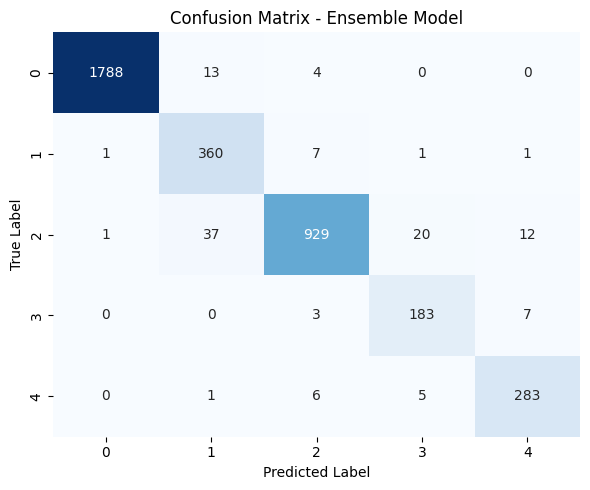

Overall ROC-AUC: 0.9976


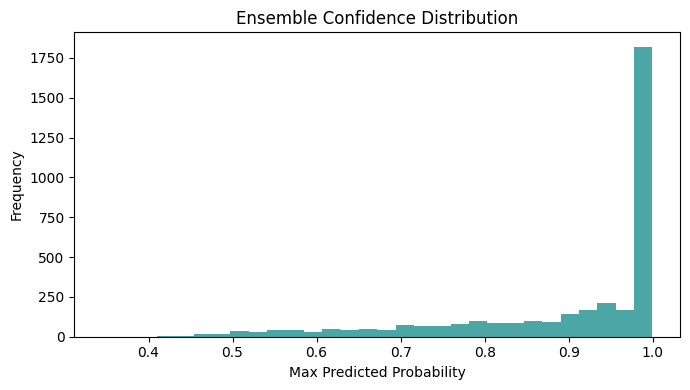

In [17]:
# Cell 9 - Ensemble Evaluation
import numpy as np
from sklearn.metrics import (
    accuracy_score,
    f1_score,
    confusion_matrix,
    classification_report,
    roc_auc_score
)
import matplotlib.pyplot as plt
import seaborn as sns

# Load saved ensemble predictions
probs = np.load(OUT_DIR / "ensemble_probs.npy")
labels = np.load(OUT_DIR / "ensemble_labels.npy")

# Convert probabilities to predicted class
preds = np.argmax(probs, axis=1)

# --- Metrics ---
acc = accuracy_score(labels, preds)
macro_f1 = f1_score(labels, preds, average="macro")
weighted_f1 = f1_score(labels, preds, average="weighted")
report = classification_report(labels, preds, digits=4)

print("✅ Ensemble Evaluation Results:")
print(f"Accuracy      : {acc:.4f}")
print(f"Macro F1      : {macro_f1:.4f}")
print(f"Weighted F1   : {weighted_f1:.4f}")
print("\nClassification Report:")
print(report)

# --- Confusion Matrix ---
cm = confusion_matrix(labels, preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.xlabel("Predicted Label")
plt.ylabel("True Label")
plt.title("Confusion Matrix - Ensemble Model")
plt.tight_layout()
plt.savefig(OUT_DIR / "ensemble_confusion_matrix.png", dpi=300)
plt.show()

# --- ROC AUC (if 5 classes) ---
try:
    auc = roc_auc_score(
        np.eye(probs.shape[1])[labels],  # one-hot true labels
        probs,
        multi_class="ovr"
    )
    print(f"Overall ROC-AUC: {auc:.4f}")
except Exception as e:
    print("ROC-AUC computation skipped:", e)

# --- Probability Distribution Plot ---
plt.figure(figsize=(7,4))
plt.hist(np.max(probs, axis=1), bins=30, alpha=0.7, color='teal')
plt.title("Ensemble Confidence Distribution")
plt.xlabel("Max Predicted Probability")
plt.ylabel("Frequency")
plt.tight_layout()
plt.savefig(OUT_DIR / "ensemble_confidence_hist.png", dpi=300)
plt.show()


Loaded 5 folds.


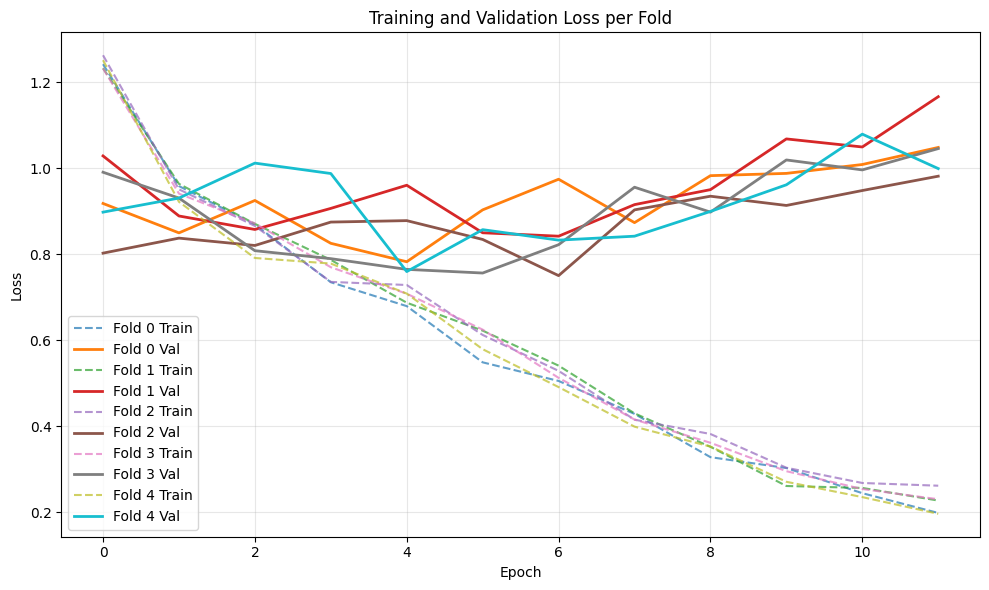

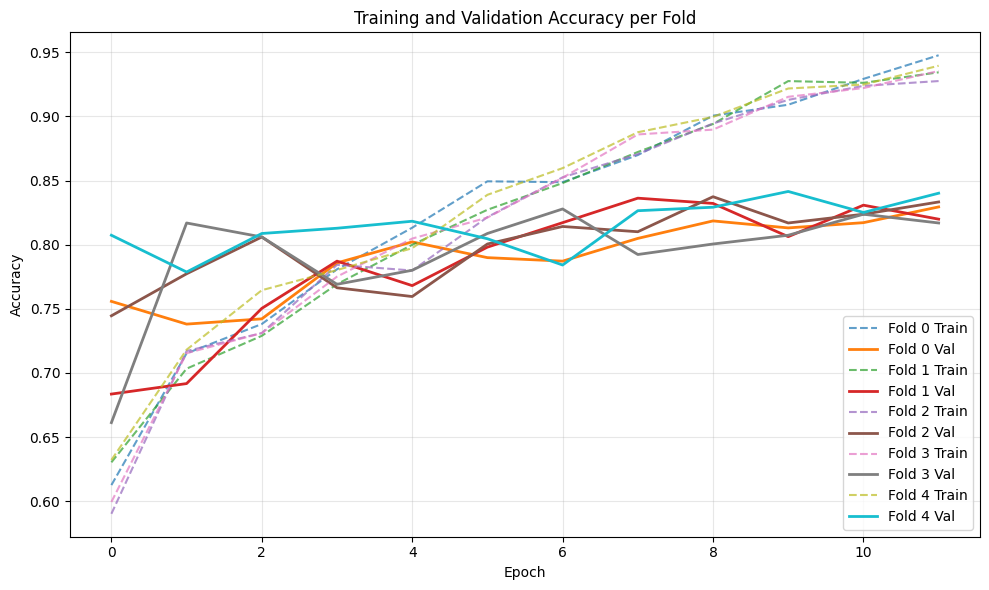

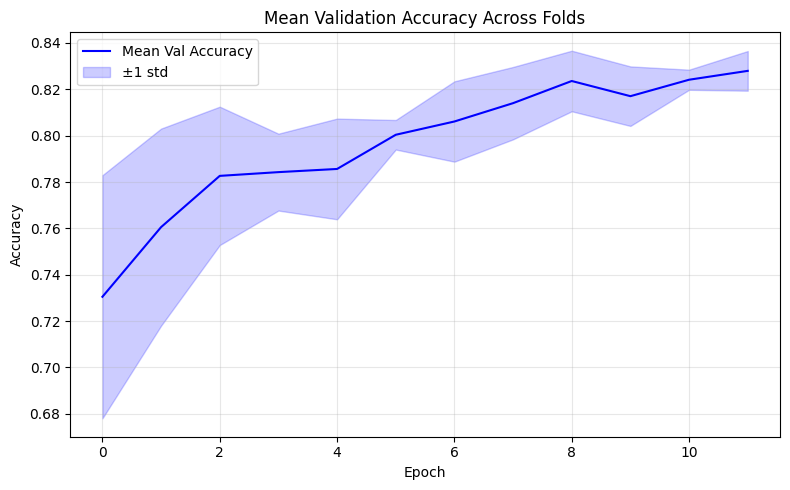

In [18]:
# Cell 10 - Plot all training/validation curves for each fold
import matplotlib.pyplot as plt
import json
import numpy as np
from pathlib import Path

# --- Load all histories ---
all_histories = {}
for i in range(N_SPLITS):
    hist_path = OUT_DIR / f"history_fold{i}.json"
    if hist_path.exists():
        with open(hist_path, "r") as f:
            all_histories[i] = json.load(f)

print(f"Loaded {len(all_histories)} folds.")

# --- Plot loss curves ---
plt.figure(figsize=(10, 6))
for fold_idx, hist in all_histories.items():
    plt.plot(hist["train_loss"], label=f"Fold {fold_idx} Train", linestyle='--', alpha=0.7)
    plt.plot(hist["val_loss"], label=f"Fold {fold_idx} Val", linewidth=2)
plt.title("Training and Validation Loss per Fold")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(OUT_DIR / "loss_curves.png", dpi=300)
plt.show()

# --- Plot accuracy curves ---
plt.figure(figsize=(10, 6))
for fold_idx, hist in all_histories.items():
    plt.plot(hist["train_acc"], label=f"Fold {fold_idx} Train", linestyle='--', alpha=0.7)
    plt.plot(hist["val_acc"], label=f"Fold {fold_idx} Val", linewidth=2)
plt.title("Training and Validation Accuracy per Fold")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig(OUT_DIR / "accuracy_curves.png", dpi=300)
plt.show()

# --- Mean validation accuracy curve (if all folds same epoch count) ---
if len(all_histories) > 1:
    min_epochs = min(len(h["val_acc"]) for h in all_histories.values())
    val_acc_matrix = np.array([h["val_acc"][:min_epochs] for h in all_histories.values()])
    mean_val_acc = val_acc_matrix.mean(axis=0)
    std_val_acc = val_acc_matrix.std(axis=0)

    plt.figure(figsize=(8,5))
    plt.plot(mean_val_acc, color='blue', label='Mean Val Accuracy')
    plt.fill_between(range(len(mean_val_acc)), mean_val_acc-std_val_acc, mean_val_acc+std_val_acc,
                     color='blue', alpha=0.2, label='±1 std')
    plt.title("Mean Validation Accuracy Across Folds")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig(OUT_DIR / "mean_val_accuracy.png", dpi=300)
    plt.show()


In [20]:
# Cell 10 - Build Ensemble Model
import torch
import torch.nn as nn

# same class definition you used during training
# (EffNetVit should already be imported)
class EnsembleModel(nn.Module):
    def __init__(self, model_paths, backbone_name='tf_efficientnet_b3_ns', num_classes=5):
        super().__init__()
        self.models = nn.ModuleList([
            EffNetVit(backbone_name=backbone_name, pretrained=False, num_classes=num_classes)
            for _ in model_paths
        ])
        for i, path in enumerate(model_paths):
            state_dict = torch.load(path, map_location='cpu')
            # remove unexpected keys if necessary
            state_dict = {k: v for k, v in state_dict.items() if k in self.models[i].state_dict()}
            self.models[i].load_state_dict(state_dict, strict=False)
            self.models[i].eval()

    def forward(self, x):
        with torch.no_grad():
            preds = [torch.softmax(m(x), dim=1) for m in self.models]
            avg_preds = torch.mean(torch.stack(preds), dim=0)
        return avg_preds

# --- Paths to your saved fold models ---
model_paths = [
    OUT_DIR / f"best_model_fold{i}.pth"
    for i in range(5)
]

# --- Build the ensemble ---
ensemble_model = EnsembleModel(model_paths).to(device)
ensemble_model.eval()

print("✅ Ensemble model successfully created and ready for evaluation.")


✅ Ensemble model successfully created and ready for evaluation.



✅ Ensemble Accuracy: 0.9617

Classification Report:
              precision    recall  f1-score   support

           0     1.0000    0.9861    0.9930       361
           1     0.8675    0.9730    0.9172        74
           2     0.9637    0.9347    0.9490       199
           3     0.8409    0.9487    0.8916        39
           4     0.9464    0.8983    0.9217        59

    accuracy                         0.9617       732
   macro avg     0.9237    0.9482    0.9345       732
weighted avg     0.9639    0.9617    0.9622       732



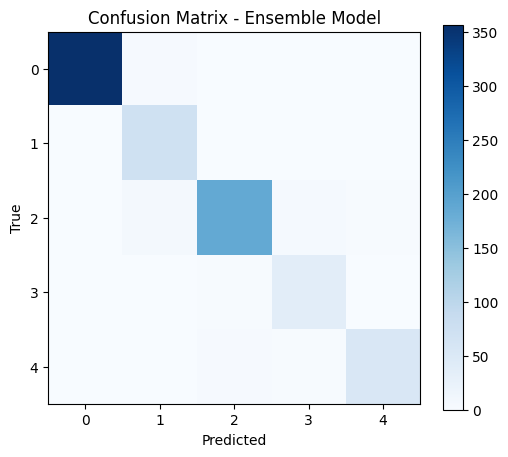

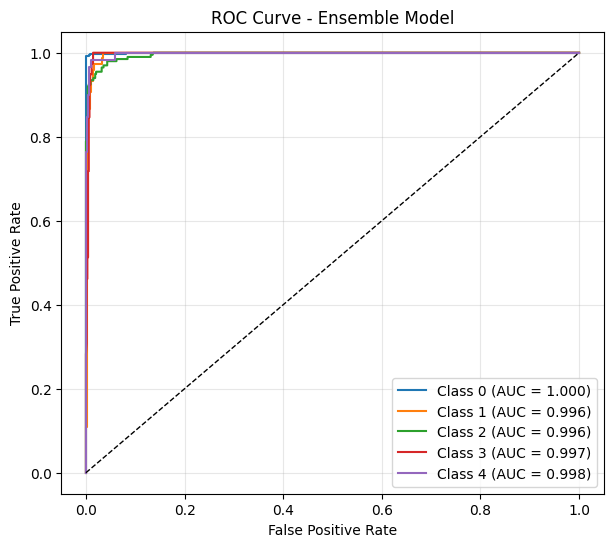


🌟 Macro-average AUC: 0.9974


In [21]:
# Cell 11 - Ensemble Evaluation and ROC Curves
import torch
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    roc_curve, auc, roc_auc_score, classification_report, confusion_matrix
)
from sklearn.preprocessing import label_binarize

# --- Evaluation mode ---
ensemble_model.eval()

all_labels = []
all_probs = []

# Use your validation loader or full validation dataset
valid_loader = DataLoader(valid_ds, batch_size=BATCH_SIZE, shuffle=False)

with torch.no_grad():
    for imgs, labels in valid_loader:
        imgs = imgs.to(device)
        outputs = ensemble_model(imgs)
        probs = outputs.detach().cpu().numpy()
        all_probs.append(probs)
        all_labels.append(labels.numpy())

all_probs = np.concatenate(all_probs)
all_labels = np.concatenate(all_labels)

# --- Convert to predicted classes ---
preds = np.argmax(all_probs, axis=1)

# --- Compute metrics ---
acc = np.mean(preds == all_labels)
print(f"\n✅ Ensemble Accuracy: {acc:.4f}")
print("\nClassification Report:")
print(classification_report(all_labels, preds, digits=4))

# --- Confusion Matrix ---
cm = confusion_matrix(all_labels, preds)
plt.figure(figsize=(6,5))
plt.imshow(cm, cmap='Blues')
plt.title("Confusion Matrix - Ensemble Model")
plt.colorbar()
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

# --- ROC Curve (multi-class) ---
y_true_bin = label_binarize(all_labels, classes=[0,1,2,3,4])
fpr, tpr, roc_auc = {}, {}, {}

for i in range(5):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], all_probs[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

plt.figure(figsize=(7,6))
for i in range(5):
    plt.plot(fpr[i], tpr[i], label=f"Class {i} (AUC = {roc_auc[i]:.3f})")
plt.plot([0,1], [0,1], 'k--', lw=1)
plt.title("ROC Curve - Ensemble Model")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.legend(loc="lower right")
plt.grid(True, alpha=0.3)
plt.show()

# --- Average AUC ---
macro_auc = roc_auc_score(y_true_bin, all_probs, average='macro')
print(f"\n🌟 Macro-average AUC: {macro_auc:.4f}")


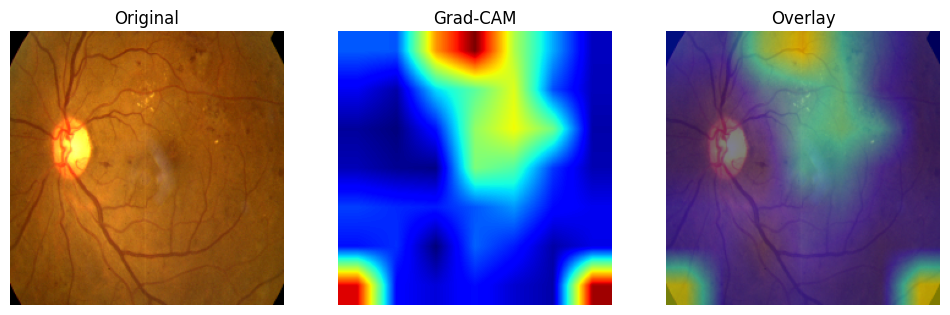

In [28]:
# --- Fixed Grad-CAM for EffNetVit ---
import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_path = "/kaggle/input/aptos2019-blindness-detection/test_images/009c019a7309.png"

# --- Preprocess image ---
img_bgr = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))

input_tensor = torch.tensor(img_resized / 255., dtype=torch.float).permute(2,0,1).unsqueeze(0).to(device)
mean = torch.tensor([0.485,0.456,0.406], device=device).view(1,3,1,1)
std  = torch.tensor([0.229,0.224,0.225], device=device).view(1,3,1,1)
input_tensor = (input_tensor - mean) / std

# --- Hook the projected conv output ---
class GradCAM:
    def __init__(self, model):
        self.model = model
        self.model.eval()
        self.gradients = None
        self.features = None

        # hook proj conv
        self.model.proj.register_forward_hook(self.forward_hook)
        self.model.proj.register_full_backward_hook(self.backward_hook)

    def forward_hook(self, module, input, output):
        self.features = output.detach()

    def backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, class_idx=None):
        logits = self.model(x)
        if class_idx is None:
            class_idx = logits.argmax(dim=1).item()
        self.model.zero_grad()
        logits[0, class_idx].backward(retain_graph=True)

        # Grad-CAM computation
        weights = self.gradients.mean(dim=(2,3), keepdim=True)
        cam = (weights * self.features).sum(1, keepdim=True)
        cam = torch.relu(cam)
        cam = torch.nn.functional.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

# --- Run Grad-CAM for all folds and ensemble ---
cams = []
for fold_idx, m in enumerate(models):
    grad_cam = GradCAM(m)
    cam = grad_cam(input_tensor)
    cams.append(cam)

ensemble_cam = np.mean(cams, axis=0)

# --- Overlay ---
heatmap = cv2.applyColorMap(np.uint8(255 * ensemble_cam), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
overlay = 0.5 * img_resized + 0.5 * heatmap
overlay = overlay.astype(np.uint8)

# --- Plot ---
plt.figure(figsize=(12,5))
plt.subplot(1,3,1)
plt.imshow(img_resized)
plt.title("Original")
plt.axis("off")
plt.subplot(1,3,2)
plt.imshow(ensemble_cam, cmap='jet')
plt.title("Grad-CAM")
plt.axis("off")
plt.subplot(1,3,3)
plt.imshow(overlay)
plt.title("Overlay")
plt.axis("off")
plt.show()


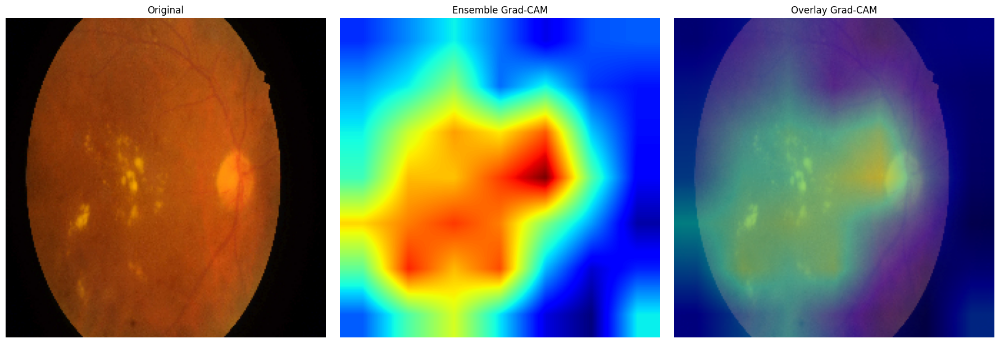

In [33]:
import torch
import torch.nn.functional as F
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Image preprocessing ---
img_path = "/kaggle/input/idrid-dataset/Imagenes/Imagenes/IDRiD_015test.jpg"
img_bgr = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))
input_tensor = torch.tensor(img_resized / 255., dtype=torch.float).permute(2,0,1).unsqueeze(0).to(device)

# Normalize
mean = torch.tensor([0.485,0.456,0.406], device=device).view(1,3,1,1)
std  = torch.tensor([0.229,0.224,0.225], device=device).view(1,3,1,1)
input_tensor = (input_tensor - mean) / std

# --- Robust Grad-CAM class ---
class GradCAM:
    def __init__(self, model):
        self.model = model
        self.model.eval()
        self.gradients = None
        self.features = None
        # Hook the projected conv output (before transformer)
        self.model.proj.register_forward_hook(self._forward_hook)
        self.model.proj.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.features = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, class_idx=None, smooth=False, n_passes=5):
        cams = []
        for _ in range(n_passes if smooth else 1):
            logits = self.model(x)
            if class_idx is None:
                class_idx = logits.argmax(dim=1).item()
            self.model.zero_grad()
            logits[0, class_idx].backward(retain_graph=True)

            weights = self.gradients.mean(dim=(2,3), keepdim=True)
            cam = (weights * self.features).sum(1, keepdim=True)
            cam = F.relu(cam)
            cam = F.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
            cam = cam.squeeze().cpu().numpy()
            cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
            cams.append(cam)
        return np.mean(cams, axis=0)

# --- Ensemble Grad-CAM ---
def ensemble_gradcam(models, input_tensor, class_idx=None, smooth=True):
    cams = []
    for m in models:
        gc = GradCAM(m)
        cam = gc(input_tensor, class_idx=class_idx, smooth=smooth)
        cams.append(cam)
    return np.mean(cams, axis=0)

# --- Compute ensemble Grad-CAM ---
ensemble_cam = ensemble_gradcam(models, input_tensor, smooth=True)

# --- Overlay Grad-CAM ---
def overlay_cam(img, cam, alpha=0.5, colormap=cv2.COLORMAP_JET):
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), colormap)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(img.astype(np.uint8), 1-alpha, heatmap, alpha, 0)
    return overlay

overlay = overlay_cam(img_resized, ensemble_cam, alpha=0.5)

# --- Plot ---
plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
plt.imshow(img_resized)
plt.title("Original")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(ensemble_cam, cmap='jet')
plt.title("Ensemble Grad-CAM")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(overlay)
plt.title("Overlay Grad-CAM")
plt.axis("off")

plt.tight_layout()
plt.show()


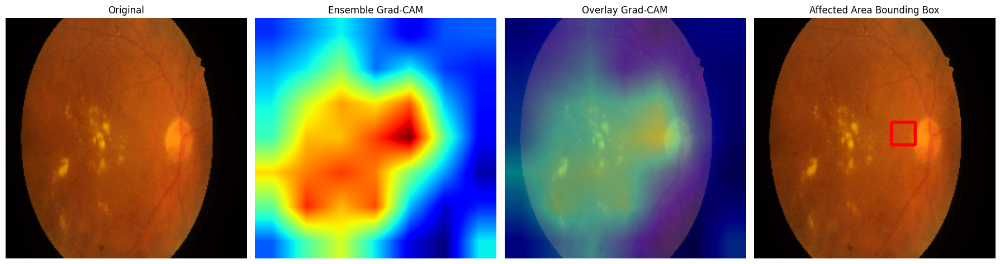

In [34]:
import torch
import torch.nn.functional as F
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Preprocess Image ---
img_path = "/kaggle/input/idrid-dataset/Imagenes/Imagenes/IDRiD_015test.jpg"
img_bgr = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))
input_tensor = torch.tensor(img_resized / 255., dtype=torch.float).permute(2,0,1).unsqueeze(0).to(device)

mean = torch.tensor([0.485,0.456,0.406], device=device).view(1,3,1,1)
std  = torch.tensor([0.229,0.224,0.225], device=device).view(1,3,1,1)
input_tensor = (input_tensor - mean) / std

# --- Grad-CAM Class ---
class GradCAM:
    def __init__(self, model):
        self.model = model
        self.model.eval()
        self.gradients = None
        self.features = None
        self.model.proj.register_forward_hook(self._forward_hook)
        self.model.proj.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.features = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, class_idx=None, smooth=True, n_passes=5):
        cams = []
        for _ in range(n_passes if smooth else 1):
            logits = self.model(x)
            if class_idx is None:
                class_idx = logits.argmax(dim=1).item()
            self.model.zero_grad()
            logits[0, class_idx].backward(retain_graph=True)
            weights = self.gradients.mean(dim=(2,3), keepdim=True)
            cam = (weights * self.features).sum(1, keepdim=True)
            cam = F.relu(cam)
            cam = F.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
            cam = cam.squeeze().cpu().numpy()
            cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
            cams.append(cam)
        return np.mean(cams, axis=0)

# --- Ensemble Grad-CAM ---
def ensemble_gradcam(models, input_tensor, class_idx=None, smooth=True):
    cams = [GradCAM(m)(input_tensor, class_idx=class_idx, smooth=smooth) for m in models]
    return np.mean(cams, axis=0)

# --- Generate CAM ---
ensemble_cam = ensemble_gradcam(models, input_tensor, smooth=True)

# --- Create bounding box around affected area ---
threshold = 0.5  # Only consider pixels with CAM > threshold
mask = (ensemble_cam > threshold).astype(np.uint8)
contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

bbox_img = img_resized.copy()
for cnt in contours:
    if cv2.contourArea(cnt) > 50:  # ignore tiny regions
        x, y, w, h = cv2.boundingRect(cnt)
        cv2.rectangle(bbox_img, (x,y), (x+w, y+h), (255,0,0), 2)

# --- Overlay CAM ---
heatmap = cv2.applyColorMap(np.uint8(255 * ensemble_cam), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
overlay = cv2.addWeighted(img_resized.astype(np.uint8), 0.5, heatmap, 0.5, 0)

# --- Plot ---
plt.figure(figsize=(18,6))
plt.subplot(1,4,1)
plt.imshow(img_resized)
plt.title("Original")
plt.axis("off")

plt.subplot(1,4,2)
plt.imshow(ensemble_cam, cmap='jet')
plt.title("Ensemble Grad-CAM")
plt.axis("off")

plt.subplot(1,4,3)
plt.imshow(overlay)
plt.title("Overlay Grad-CAM")
plt.axis("off")

plt.subplot(1,4,4)
plt.imshow(bbox_img)
plt.title("Affected Area Bounding Box")
plt.axis("off")

plt.tight_layout()
plt.show()


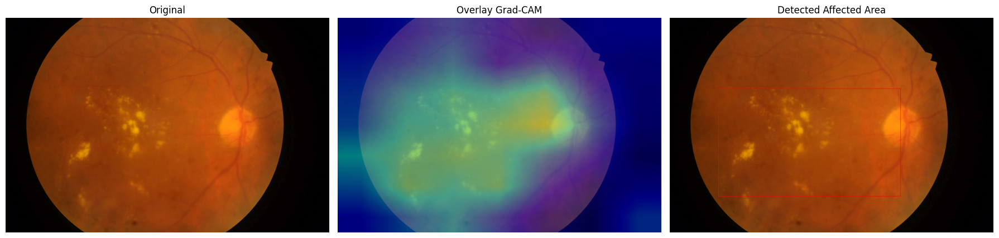

In [35]:
# --- Upsample CAM to original image size ---
orig_h, orig_w = img_rgb.shape[:2]
cam_up = cv2.resize(ensemble_cam, (orig_w, orig_h))

# --- Smooth CAM ---
cam_up = cv2.GaussianBlur(cam_up, (15,15), 0)

# --- Adaptive threshold ---
thresh_val = np.percentile(cam_up, 85)  # top 15% activations
mask = (cam_up >= thresh_val).astype(np.uint8)

# --- Find largest contour for bounding box ---
contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
if contours:
    largest_contour = max(contours, key=cv2.contourArea)
    x, y, w, h = cv2.boundingRect(largest_contour)
    bbox_img = img_rgb.copy()
    cv2.rectangle(bbox_img, (x,y), (x+w, y+h), (255,0,0), 3)
else:
    bbox_img = img_rgb.copy()

# --- Overlay CAM ---
heatmap = cv2.applyColorMap(np.uint8(255 * cam_up), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
overlay = cv2.addWeighted(img_rgb.astype(np.uint8), 0.5, heatmap, 0.5, 0)

# --- Display ---
plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
plt.imshow(img_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(overlay)
plt.title("Overlay Grad-CAM")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(bbox_img)
plt.title("Detected Affected Area")
plt.axis("off")

plt.tight_layout()
plt.show()


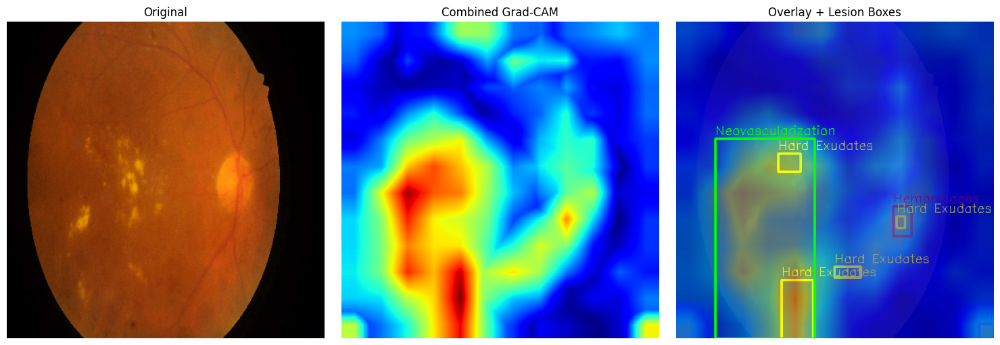

In [36]:
import torch
import torch.nn.functional as F
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Settings ---
IMG_SIZE = 384
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LESION_CLASSES = ["Microaneurysms", "Hemorrhages", "Hard Exudates", "Neovascularization"]
LESION_COLORS = [(0,0,255), (255,0,0), (255,255,0), (0,255,0)]  # BGR for OpenCV

# --- Load and preprocess image ---
img_path = "/kaggle/input/idrid-dataset/Imagenes/Imagenes/IDRiD_015test.jpg"
img_bgr = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))

input_tensor = torch.tensor(img_resized / 255., dtype=torch.float).permute(2,0,1).unsqueeze(0).to(device)
mean = torch.tensor([0.485,0.456,0.406], device=device).view(1,3,1,1)
std  = torch.tensor([0.229,0.224,0.225], device=device).view(1,3,1,1)
input_tensor = (input_tensor - mean) / std

# --- Grad-CAM class ---
class GradCAM:
    def __init__(self, model):
        self.model = model
        self.model.eval()
        self.gradients = None
        self.features = None

        # Hook the projected conv output (before transformer)
        self.model.proj.register_forward_hook(self._forward_hook)
        self.model.proj.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.features = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, class_idx):
        self.model.zero_grad()
        logits = self.model(x)
        logits[0, class_idx].backward(retain_graph=True)

        # Compute Grad-CAM
        weights = self.gradients.mean(dim=(2,3), keepdim=True)
        cam = (weights * self.features).sum(1, keepdim=True)
        cam = torch.relu(cam)
        cam = F.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

# --- Run Grad-CAM for all lesions ---
ensemble_cams = []
for class_idx in range(len(LESION_CLASSES)):
    cams = []
    for m in models:  # your trained ensemble models
        grad_cam = GradCAM(m)
        cam = grad_cam(input_tensor, class_idx)
        cams.append(cam)
    ensemble_cams.append(np.mean(cams, axis=0))

# --- Create bounding boxes ---
bboxes = []
for cam in ensemble_cams:
    # Threshold to detect affected areas
    thresh = (cam > 0.5).astype(np.uint8)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    boxes = [cv2.boundingRect(cnt) for cnt in contours if cv2.contourArea(cnt) > 20]  # ignore tiny noise
    bboxes.append(boxes)

# --- Overlay heatmaps + bounding boxes ---
overlay = img_resized.copy()
for class_idx, boxes in enumerate(bboxes):
    cam_color = cv2.applyColorMap(np.uint8(255*ensemble_cams[class_idx]), cv2.COLORMAP_JET)
    cam_color = cv2.cvtColor(cam_color, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(overlay, 0.6, cam_color, 0.4, 0)
    
    for x,y,w,h in boxes:
        cv2.rectangle(overlay, (x,y), (x+w, y+h), LESION_COLORS[class_idx], 2)
        cv2.putText(overlay, LESION_CLASSES[class_idx], (x, y-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, LESION_COLORS[class_idx], 1)

# --- Display results ---
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(img_resized)
plt.title("Original")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(np.max(np.stack(ensemble_cams), axis=0), cmap="jet")
plt.title("Combined Grad-CAM")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(overlay)
plt.title("Overlay + Lesion Boxes")
plt.axis("off")
plt.tight_layout()
plt.show()


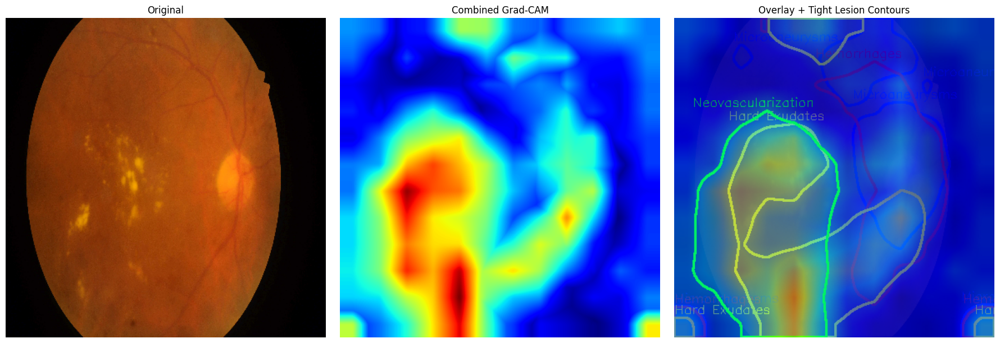

In [37]:
import torch
import torch.nn.functional as F
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.filters import threshold_otsu

# --- Settings ---
IMG_SIZE = 384
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LESION_CLASSES = ["Microaneurysms", "Hemorrhages", "Hard Exudates", "Neovascularization"]
LESION_COLORS = [(0,0,255), (255,0,0), (255,255,0), (0,255,0)]  # BGR for OpenCV

# --- Load & preprocess image ---
img_path = "/kaggle/input/idrid-dataset/Imagenes/Imagenes/IDRiD_015test.jpg"
img_bgr = cv2.imread(img_path)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))

input_tensor = torch.tensor(img_resized / 255., dtype=torch.float).permute(2,0,1).unsqueeze(0).to(device)
mean = torch.tensor([0.485,0.456,0.406], device=device).view(1,3,1,1)
std  = torch.tensor([0.229,0.224,0.225], device=device).view(1,3,1,1)
input_tensor = (input_tensor - mean) / std

# --- Grad-CAM class ---
class GradCAM:
    def __init__(self, model):
        self.model = model
        self.model.eval()
        self.gradients = None
        self.features = None

        self.model.proj.register_forward_hook(self._forward_hook)
        self.model.proj.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.features = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, class_idx):
        self.model.zero_grad()
        logits = self.model(x)
        logits[0, class_idx].backward(retain_graph=True)

        weights = self.gradients.mean(dim=(2,3), keepdim=True)
        cam = (weights * self.features).sum(1, keepdim=True)
        cam = torch.relu(cam)
        cam = F.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

# --- Ensemble Grad-CAM ---
ensemble_cams = []
for class_idx in range(len(LESION_CLASSES)):
    cams = []
    for m in models:  # your trained ensemble models
        grad_cam = GradCAM(m)
        cam = grad_cam(input_tensor, class_idx)
        # Optional: smooth CAM using Gaussian blur
        cam = cv2.GaussianBlur(cam, (7,7), 0)
        cams.append(cam)
    ensemble_cams.append(np.mean(cams, axis=0))

# --- Detect lesions with tight contours ---
overlay = img_resized.copy()
for class_idx, cam in enumerate(ensemble_cams):
    # Use Otsu thresholding for adaptive detection
    thresh_val = threshold_otsu(cam)
    mask = (cam > thresh_val).astype(np.uint8)
    
    # Find contours
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    # Overlay lesion contours on original image
    color = LESION_COLORS[class_idx]
    for cnt in contours:
        if cv2.contourArea(cnt) < 10:  # skip tiny noise
            continue
        cv2.drawContours(overlay, [cnt], -1, color, 2)
        x,y,w,h = cv2.boundingRect(cnt)
        cv2.putText(overlay, LESION_CLASSES[class_idx], (x, y-5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 1)

    # Blend heatmap
    heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(overlay, 0.6, heatmap, 0.4, 0)

# --- Display ---
plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
plt.imshow(img_resized)
plt.title("Original")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(np.max(np.stack(ensemble_cams), axis=0), cmap="jet")
plt.title("Combined Grad-CAM")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(overlay)
plt.title("Overlay + Tight Lesion Contours")
plt.axis("off")
plt.tight_layout()
plt.show()


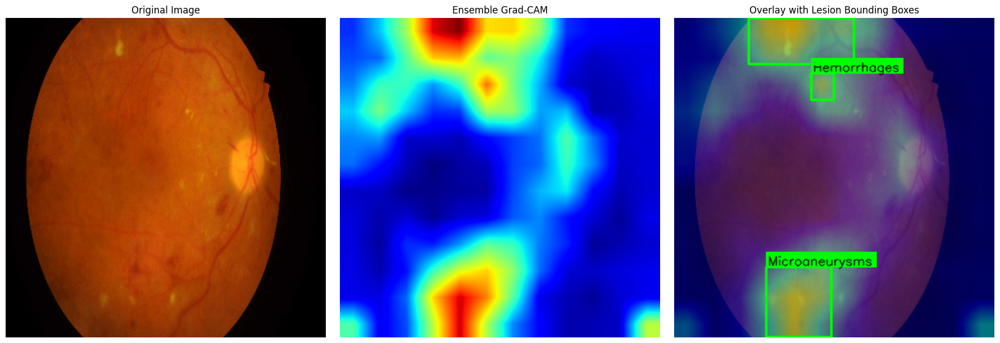

In [42]:
import torch
import torch.nn.functional as F
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Configuration ---
IMG_PATH = "/kaggle/input/idrid-dataset/Imagenes/Imagenes/IDRiD_016test.jpg"
IMG_SIZE = 384
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LESION_TYPES = ["Microaneurysms", "Hemorrhages", "Hard Exudates", "Neovascularization"]

# --- Image preprocessing ---
img_bgr = cv2.imread(IMG_PATH)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))
input_tensor = torch.tensor(img_resized / 255., dtype=torch.float).permute(2,0,1).unsqueeze(0).to(DEVICE)
mean = torch.tensor([0.485,0.456,0.406], device=DEVICE).view(1,3,1,1)
std  = torch.tensor([0.229,0.224,0.225], device=DEVICE).view(1,3,1,1)
input_tensor = (input_tensor - mean) / std

# --- Grad-CAM Class ---
class GradCAM:
    def __init__(self, model):
        self.model = model.eval()
        self.features = None
        self.gradients = None
        self.model.proj.register_forward_hook(self._forward_hook)
        self.model.proj.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.features = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, class_idx=None):
        logits = self.model(x)
        if class_idx is None:
            class_idx = logits.argmax(dim=1).item()
        self.model.zero_grad()
        logits[0, class_idx].backward(retain_graph=True)
        # Grad-CAM
        weights = self.gradients.mean(dim=(2,3), keepdim=True)
        cam = (weights * self.features).sum(1, keepdim=True)
        cam = F.relu(cam)
        cam = F.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

# --- Ensemble Grad-CAM ---
cams = []
for fold_idx, m in enumerate(models):  # models: list of loaded fold models
    grad_cam = GradCAM(m)
    cam = grad_cam(input_tensor)
    cams.append(cam)

ensemble_cam = np.mean(cams, axis=0)

# --- Create overlay ---
heatmap = cv2.applyColorMap(np.uint8(255*ensemble_cam), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
overlay = cv2.addWeighted(img_resized.astype(np.uint8), 0.5, heatmap, 0.5, 0)

# --- Bounding boxes for lesions ---
thresh = 0.4  # threshold for activation
binary_mask = (ensemble_cam > thresh).astype(np.uint8)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

for i, cnt in enumerate(contours):
    x, y, w, h = cv2.boundingRect(cnt)
    # clamp coords
    x1, y1 = max(x,0), max(y,0)
    x2, y2 = min(x+w, IMG_SIZE-1), min(y+h, IMG_SIZE-1)
    cv2.rectangle(overlay, (x1, y1), (x2, y2), color=(0,255,0), thickness=2)
    # Add readable label
    lesion_name = LESION_TYPES[i % len(LESION_TYPES)]
    rect_size = cv2.getTextSize(lesion_name, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)[0]
    rect_x2 = min(x1 + rect_size[0] + 6, IMG_SIZE-1)
    rect_y1 = max(y1 - rect_size[1] - 6, 0)
    rect_y2 = y1
    cv2.rectangle(overlay, (x1, rect_y1), (rect_x2, rect_y2), color=(0,255,0), thickness=-1)
    cv2.putText(overlay, lesion_name, (x1+2, y1-2), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0,0,0), 1, cv2.LINE_AA)

# --- Plot results ---
plt.figure(figsize=(18,6))
plt.subplot(1,3,1)
plt.imshow(img_resized)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(ensemble_cam, cmap='jet')
plt.title("Ensemble Grad-CAM")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(overlay)
plt.title("Overlay with Lesion Bounding Boxes")
plt.axis("off")

plt.tight_layout()
plt.show()


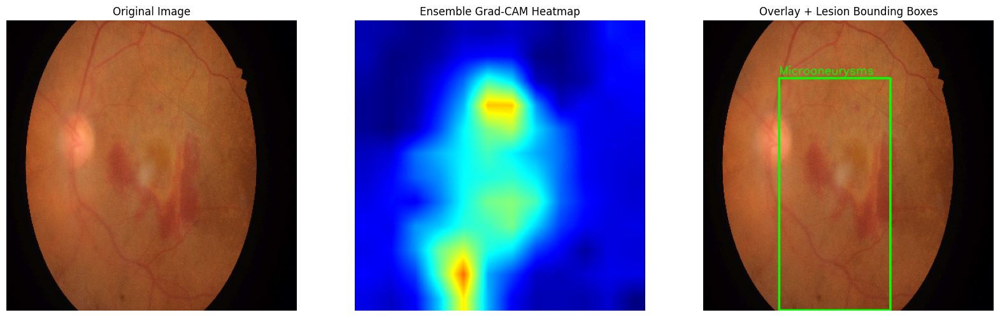

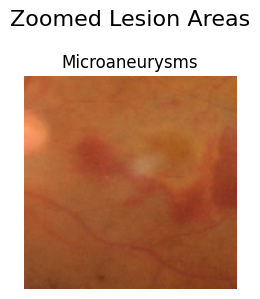

In [44]:
import torch
import torch.nn.functional as F
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Config ---
IMG_PATH = "/kaggle/input/idrid-dataset/Imagenes/Imagenes/IDRiD_005.jpg"
IMG_SIZE = 384
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LESION_TYPES = ["Microaneurysms", "Hemorrhages", "Hard Exudates", "Neovascularization"]
ZOOM_SIZE = 96  # size of zoomed-in lesion patch

# --- Preprocess Image ---
img_bgr = cv2.imread(IMG_PATH)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))
input_tensor = torch.tensor(img_resized / 255., dtype=torch.float).permute(2,0,1).unsqueeze(0).to(DEVICE)
mean = torch.tensor([0.485,0.456,0.406], device=DEVICE).view(1,3,1,1)
std  = torch.tensor([0.229,0.224,0.225], device=DEVICE).view(1,3,1,1)
input_tensor = (input_tensor - mean) / std

# --- Grad-CAM Class ---
class GradCAM:
    def __init__(self, model):
        self.model = model.eval()
        self.features = None
        self.gradients = None
        self.model.proj.register_forward_hook(self._forward_hook)
        self.model.proj.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.features = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, class_idx=None):
        logits = self.model(x)
        if class_idx is None:
            class_idx = logits.argmax(dim=1).item()
        self.model.zero_grad()
        logits[0, class_idx].backward(retain_graph=True)
        weights = self.gradients.mean(dim=(2,3), keepdim=True)
        cam = (weights * self.features).sum(1, keepdim=True)
        cam = F.relu(cam)
        cam = F.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

# --- Ensemble Grad-CAM ---
cams = []
for fold_idx, m in enumerate(models):  # list of loaded fold models
    grad_cam = GradCAM(m)
    cam = grad_cam(input_tensor)
    cams.append(cam)

ensemble_cam = np.mean(cams, axis=0)

# --- Threshold and Find Lesions ---
thresh = 0.4
binary_mask = (ensemble_cam > thresh).astype(np.uint8)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# --- Overlay Image ---
overlay = img_resized.copy()
lesion_patches = []
for i, cnt in enumerate(contours):
    x, y, w, h = cv2.boundingRect(cnt)
    # Clamp coordinates
    x1, y1 = max(x,0), max(y,0)
    x2, y2 = min(x+w, IMG_SIZE-1), min(y+h, IMG_SIZE-1)
    cv2.rectangle(overlay, (x1,y1), (x2,y2), color=(0,255,0), thickness=2)
    
    # Add label
    lesion_name = LESION_TYPES[i % len(LESION_TYPES)]
    cv2.putText(overlay, lesion_name, (x1, max(y1-5,0)), cv2.FONT_HERSHEY_SIMPLEX,
                0.5, (0,255,0), 1, cv2.LINE_AA)
    
    # Extract zoomed lesion patch
    patch = img_resized[y1:y2, x1:x2]
    if patch.size > 0:
        patch = cv2.resize(patch, (ZOOM_SIZE, ZOOM_SIZE))
        lesion_patches.append((lesion_name, patch))

# --- Grad-CAM Heatmap for Visualization ---
heatmap = cv2.applyColorMap(np.uint8(255*ensemble_cam), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

# --- Plot Full Figure ---
plt.figure(figsize=(20,6))
plt.subplot(1,3,1)
plt.imshow(img_resized)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1,3,2)
plt.imshow(heatmap)
plt.title("Ensemble Grad-CAM Heatmap")
plt.axis("off")

plt.subplot(1,3,3)
plt.imshow(overlay)
plt.title("Overlay + Lesion Bounding Boxes")
plt.axis("off")

# --- Plot zoomed lesion patches below ---
if lesion_patches:
    n_patches = len(lesion_patches)
    plt.figure(figsize=(3*n_patches, 3))
    for idx, (name, patch) in enumerate(lesion_patches):
        plt.subplot(1, n_patches, idx+1)
        plt.imshow(patch)
        plt.title(name)
        plt.axis("off")
    plt.suptitle("Zoomed Lesion Areas", fontsize=16)
    plt.tight_layout()
plt.show()


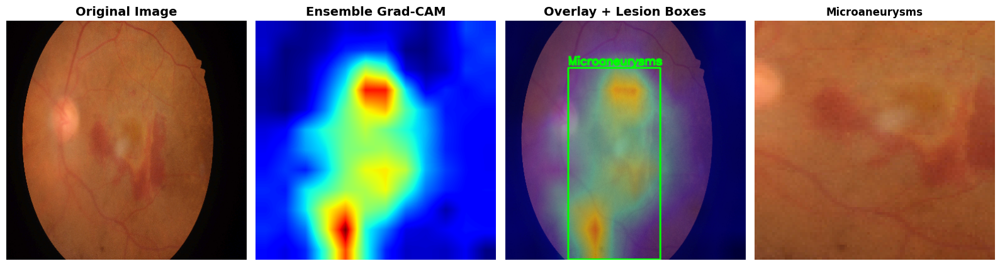

In [48]:
import torch
import torch.nn.functional as F
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Config ---
IMG_PATH = "/kaggle/input/idrid-dataset/Imagenes/Imagenes/IDRiD_005.jpg"
IMG_SIZE = 384
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
LESION_TYPES = ["Microaneurysms", "Hemorrhages", "Hard Exudates", "Neovascularization"]
ZOOM_SIZE = 96  # size of zoomed patch

# --- Preprocess Image ---
img_bgr = cv2.imread(IMG_PATH)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
img_resized = cv2.resize(img_rgb, (IMG_SIZE, IMG_SIZE))
input_tensor = torch.tensor(img_resized / 255., dtype=torch.float).permute(2,0,1).unsqueeze(0).to(DEVICE)
mean = torch.tensor([0.485,0.456,0.406], device=DEVICE).view(1,3,1,1)
std  = torch.tensor([0.229,0.224,0.225], device=DEVICE).view(1,3,1,1)
input_tensor = (input_tensor - mean) / std

# --- Grad-CAM Class ---
class GradCAM:
    def __init__(self, model):
        self.model = model.eval()
        self.features = None
        self.gradients = None
        self.model.proj.register_forward_hook(self._forward_hook)
        self.model.proj.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.features = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, class_idx=None):
        logits = self.model(x)
        if class_idx is None:
            class_idx = logits.argmax(dim=1).item()
        self.model.zero_grad()
        logits[0, class_idx].backward(retain_graph=True)
        weights = self.gradients.mean(dim=(2,3), keepdim=True)
        cam = (weights * self.features).sum(1, keepdim=True)
        cam = F.relu(cam)
        cam = F.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

# --- Ensemble Grad-CAM ---
cams = []
for fold_idx, m in enumerate(models):
    grad_cam = GradCAM(m)
    cam = grad_cam(input_tensor)
    cams.append(cam)
ensemble_cam = np.mean(cams, axis=0)

# --- Overlay ---
heatmap = cv2.applyColorMap(np.uint8(255*ensemble_cam), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
overlay = cv2.addWeighted(img_resized.astype(np.uint8), 0.6, heatmap, 0.4, 0)

# --- Detect Lesion Regions ---
thresh = 0.4
binary_mask = (ensemble_cam > thresh).astype(np.uint8)
contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
zoomed_patches = []

for i, cnt in enumerate(contours):
    x, y, w, h = cv2.boundingRect(cnt)
    x1, y1 = max(x,0), max(y,0)
    x2, y2 = min(x+w, IMG_SIZE-1), min(y+h, IMG_SIZE-1)
    lesion_name = LESION_TYPES[i % len(LESION_TYPES)]
    color = (0, 255, 0)
    cv2.rectangle(overlay, (x1,y1), (x2,y2), color, 2)
    cv2.putText(overlay, lesion_name, (x1, max(y1-5,0)), cv2.FONT_HERSHEY_SIMPLEX,
                0.6, color, 2, cv2.LINE_AA)
    # Save zoomed patch
    patch = img_resized[y1:y2, x1:x2]
    if patch.size != 0:
        patch_resized = cv2.resize(patch, (ZOOM_SIZE, ZOOM_SIZE))
        zoomed_patches.append((patch_resized, lesion_name))

# --- Plot Single-Row Publication Figure ---
num_cols = 3 + len(zoomed_patches)
fig, axes = plt.subplots(1, num_cols, figsize=(4*num_cols, 5))
for ax in axes:
    ax.axis('off')

# Original
axes[0].imshow(img_resized)
axes[0].set_title("Original Image", fontsize=14, fontweight='bold')

# Grad-CAM
axes[1].imshow(ensemble_cam, cmap='jet')
axes[1].set_title("Ensemble Grad-CAM", fontsize=14, fontweight='bold')

# Overlay + boxes
axes[2].imshow(overlay)
axes[2].set_title("Overlay + Lesion Boxes", fontsize=14, fontweight='bold')

# Zoomed patches
for i, (patch, name) in enumerate(zoomed_patches):
    axes[3+i].imshow(patch)
    axes[3+i].set_title(f"{name}", fontsize=12, fontweight='bold')

plt.tight_layout()
plt.show()


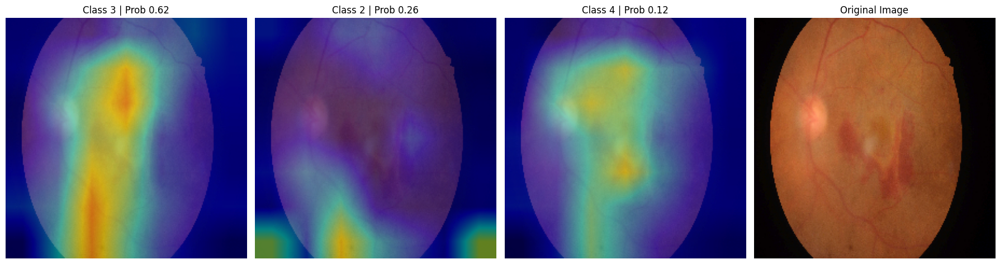

In [31]:
# --- Top-K Grad-CAM (top-3 predictions) ---
TOP_K = 3

# Get model ensemble predictions
with torch.no_grad():
    preds_sum = torch.zeros((1, 5), device=device)
    for m in models:
        preds_sum += F.softmax(m(input_tensor), dim=1)
ensemble_probs = preds_sum / len(models)
topk_probs, topk_indices = torch.topk(ensemble_probs, TOP_K, dim=1)

# Grad-CAM class (same as before)
class GradCAM:
    def __init__(self, model):
        self.model = model
        self.model.eval()
        self.gradients = None
        self.features = None
        self.model.proj.register_forward_hook(self._forward_hook)
        self.model.proj.register_full_backward_hook(self._backward_hook)

    def _forward_hook(self, module, input, output):
        self.features = output.detach()

    def _backward_hook(self, module, grad_input, grad_output):
        self.gradients = grad_output[0].detach()

    def __call__(self, x, class_idx):
        logits = self.model(x)
        self.model.zero_grad()
        logits[0, class_idx].backward(retain_graph=True)
        weights = self.gradients.mean(dim=(2,3), keepdim=True)
        cam = (weights * self.features).sum(1, keepdim=True)
        cam = torch.relu(cam)
        cam = F.interpolate(cam, size=(IMG_SIZE, IMG_SIZE), mode='bilinear', align_corners=False)
        cam = cam.squeeze().cpu().numpy()
        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
        return cam

# --- Compute Grad-CAM for top-K classes using ensemble ---
all_cams = []
for class_idx in topk_indices[0]:
    cams = []
    for m in models:
        grad_cam = GradCAM(m)
        cam = grad_cam(input_tensor, class_idx.item())
        cams.append(cam)
    ensemble_cam = np.mean(cams, axis=0)
    all_cams.append(ensemble_cam)

# --- Overlay Grad-CAM for each top-K class ---
plt.figure(figsize=(18,6))
for i, cam in enumerate(all_cams):
    heatmap = cv2.applyColorMap(np.uint8(255*cam), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(img_resized.astype(np.uint8), 0.5, heatmap, 0.5, 0)
    
    plt.subplot(1, TOP_K+1, i+1)
    plt.imshow(overlay)
    plt.title(f"Class {topk_indices[0][i].item()} | Prob {topk_probs[0,i]:.2f}")
    plt.axis("off")

plt.subplot(1, TOP_K+1, TOP_K+1)
plt.imshow(img_resized)
plt.title("Original Image")
plt.axis("off")

plt.tight_layout()
plt.show()


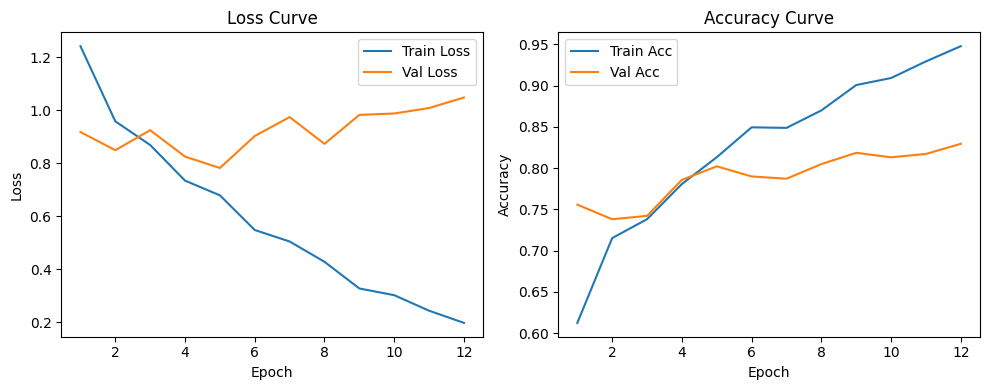

In [14]:
# Cell 8 - Plot training curves
import matplotlib.pyplot as plt

fold = 0
h = history[fold]
epochs = range(1, len(h['train_loss']) + 1)

plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
plt.plot(epochs, h['train_loss'], label='Train Loss')
plt.plot(epochs, h['val_loss'], label='Val Loss')
plt.title('Loss Curve')
plt.xlabel('Epoch'); plt.ylabel('Loss'); plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, h['train_acc'], label='Train Acc')
plt.plot(epochs, h['val_acc'], label='Val Acc')
plt.title('Accuracy Curve')
plt.xlabel('Epoch'); plt.ylabel('Accuracy'); plt.legend()

plt.tight_layout()
plt.savefig("training_curves.png", dpi=300, bbox_inches='tight')
plt.show()



Final evaluation — Val Loss: 0.1354, Val Acc: 0.9590


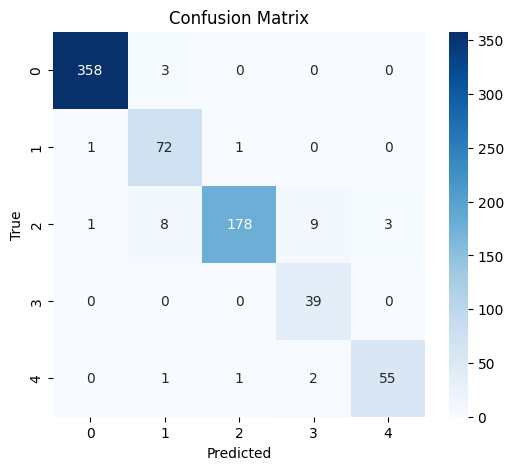


Classification Report:
              precision    recall  f1-score   support

           0     0.9944    0.9917    0.9931       361
           1     0.8571    0.9730    0.9114        74
           2     0.9889    0.8945    0.9393       199
           3     0.7800    1.0000    0.8764        39
           4     0.9483    0.9322    0.9402        59

    accuracy                         0.9590       732
   macro avg     0.9138    0.9583    0.9321       732
weighted avg     0.9639    0.9590    0.9597       732



In [9]:
# Cell 9 - Load best model & evaluate
best_model_path = OUT_DIR / f"best_model_fold0.pth"
model.load_state_dict(torch.load(best_model_path, map_location=device))
model.eval()

val_loss, val_acc, val_labels, val_probs = valid_one_epoch(model, valid_loader, criterion, device)
print(f"\nFinal evaluation — Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.4f}")

from sklearn.metrics import confusion_matrix, classification_report
import seaborn as sns

preds = val_probs.argmax(axis=1)
cm = confusion_matrix(val_labels, preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.title('Confusion Matrix')
plt.xlabel('Predicted'); plt.ylabel('True')
plt.show()

print("\nClassification Report:")
print(classification_report(val_labels, preds, digits=4))


## Cell 9 — Confusion matrix, Classification report, ROC curves

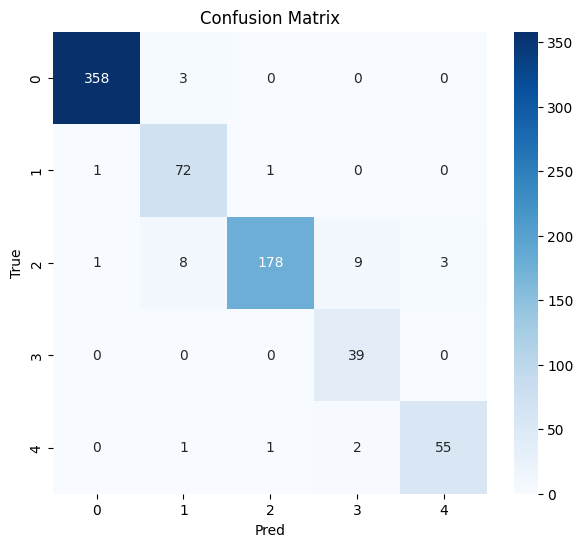

Saved: checkpoints/confusion_matrix.png
Classification Report
              precision    recall  f1-score   support

           0     0.9944    0.9917    0.9931       361
           1     0.8571    0.9730    0.9114        74
           2     0.9889    0.8945    0.9393       199
           3     0.7800    1.0000    0.8764        39
           4     0.9483    0.9322    0.9402        59

    accuracy                         0.9590       732
   macro avg     0.9138    0.9583    0.9321       732
weighted avg     0.9639    0.9590    0.9597       732



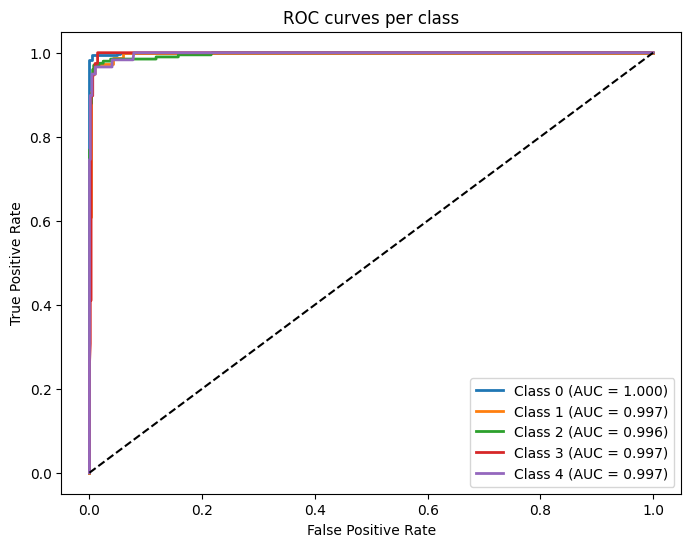

Saved: checkpoints/roc_curves.png


In [10]:
# Cell 9 - Confusion matrix, report, ROC curves
import seaborn as sns
# Use val_labels and val_probs from last validation above
preds = np.argmax(val_probs, axis=1)
cm = confusion_matrix(val_labels, preds)
plt.figure(figsize=(7,6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel("Pred")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.savefig(OUT_DIR / "confusion_matrix.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved:", OUT_DIR / "confusion_matrix.png")

print("Classification Report")
print(classification_report(val_labels, preds, digits=4))

# Macro ROC-AUC (one-vs-rest)
try:
    # compute per-class ROC and micro/macro AUCs
    n_classes = val_probs.shape[1]
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve((val_labels==i).astype(int), val_probs[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])
    # plot
    plt.figure(figsize=(8,6))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], lw=2, label=f"Class {i} (AUC = {roc_auc[i]:.3f})")
    plt.plot([0,1],[0,1],'k--')
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC curves per class")
    plt.legend(loc='lower right')
    plt.savefig(OUT_DIR / "roc_curves.png", dpi=200, bbox_inches='tight')
    plt.show()
    print("Saved:", OUT_DIR / "roc_curves.png")
except Exception as e:
    print("ROC plotting error:", e)


## Cell 10 — Simple Grad-CAM for interpretability (last backbone feature map)

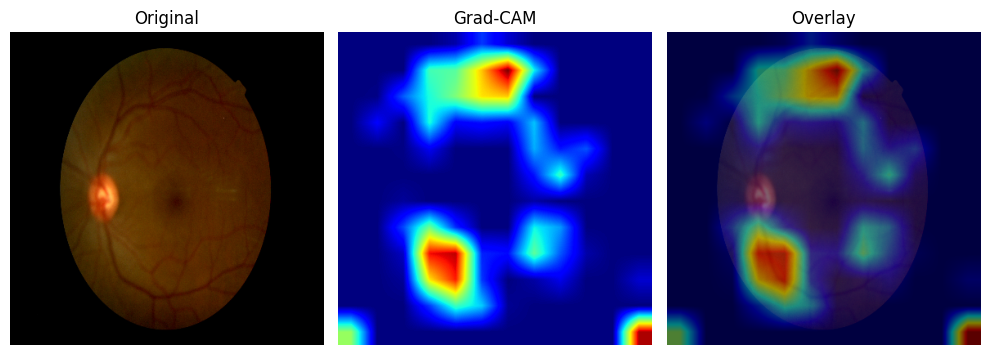

Saved: checkpoints/gradcam_example.png


In [11]:
# Cell 10 - Grad-CAM (simple implementation)
class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self.hook_handles = []
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, inp, out):
            self.activations = out.detach()
        def backward_hook(module, grad_in, grad_out):
            self.gradients = grad_out[0].detach()
        self.hook_handles.append(self.target_layer.register_forward_hook(forward_hook))
        self.hook_handles.append(self.target_layer.register_backward_hook(backward_hook))

    def __call__(self, x, class_idx=None):
        self.model.zero_grad()
        logits = self.model(x)
        if class_idx is None:
            class_idx = logits.argmax(dim=1)[0].item()
        loss = logits[0, class_idx]
        loss.backward(retain_graph=True)
        grads = self.gradients[0]  # [C, H, W]
        acts = self.activations[0] # [C, H, W]
        weights = grads.mean(dim=(1,2))  # global average pooling -> [C]
        cam = (weights[:, None, None] * acts).sum(dim=0).cpu().numpy()
        cam = np.maximum(cam, 0)
        cam = cam - cam.min()
        cam = cam / (cam.max() + 1e-8)
        return cam

# locate backbone last conv layer (depends on timm model)
# For tf_efficientnet_b3_ns, backbone.features[-1] is typically the last conv block
target_layer = model.backbone.feature_info.module() if False else None
# we will try to get a conv layer by inspecting model.backbone
# find the last nn.Conv2d in backbone
last_conv = None
for m in reversed(list(model.backbone.modules())):
    if isinstance(m, nn.Conv2d):
        last_conv = m
        break
if last_conv is None:
    raise RuntimeError("Could not find a conv layer in backbone for Grad-CAM")

gradcam = GradCAM(model, last_conv)

# run on a small batch from valid_loader
sample_imgs, sample_labels = next(iter(valid_loader))
sample_imgs_cuda = sample_imgs.to(device).float()
cam_map = gradcam(sample_imgs_cuda[:1], class_idx=None)  # first sample
# upsample cam to image size
cam_upsampled = cv2.resize(cam_map, (IMG_SIZE, IMG_SIZE))
orig = (sample_imgs[0].permute(1,2,0).cpu().numpy() * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406]))
orig = np.clip(orig, 0, 1)
heatmap = cv2.applyColorMap(np.uint8(255*cam_upsampled), cv2.COLORMAP_JET)
heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB).astype(np.float32)/255.0
overlay = 0.5*orig + 0.5*heatmap
plt.figure(figsize=(10,4))
plt.subplot(1,3,1); plt.imshow(orig); plt.title("Original"); plt.axis('off')
plt.subplot(1,3,2); plt.imshow(cam_upsampled, cmap='jet'); plt.title("Grad-CAM"); plt.axis('off')
plt.subplot(1,3,3); plt.imshow(overlay); plt.title("Overlay"); plt.axis('off')
plt.tight_layout()
plt.savefig(OUT_DIR / "gradcam_example.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved:", OUT_DIR / "gradcam_example.png")


## Cell 11 — Inference helper and sample predictions saved

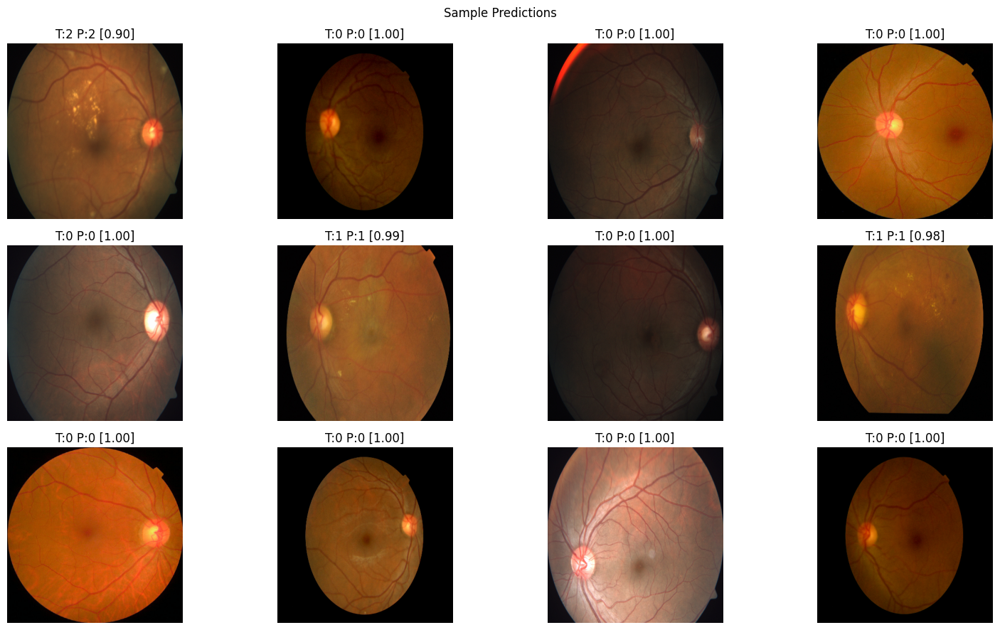

Saved: checkpoints/sample_predictions.png


In [12]:
# Cell 11 - Run inference on some validation images and save predicted images
model.eval()
SAMPLES = 12
sample_df = va_df.sample(n=SAMPLES, random_state=SEED)
ds_pred = DRDataset(sample_df, transforms=valid_transforms)
dl_pred = DataLoader(ds_pred, batch_size=4, shuffle=False)
out_images = []
with torch.no_grad():
    for imgs, labels in dl_pred:
        imgs = imgs.to(device).float()
        logits = model(imgs)
        probs = F.softmax(logits, dim=1).cpu().numpy()
        preds = np.argmax(probs, axis=1)
        for i in range(imgs.size(0)):
            img = imgs[i].cpu().permute(1,2,0).numpy()
            img = img * np.array([0.229,0.224,0.225]) + np.array([0.485,0.456,0.406])
            img = np.clip(img, 0, 1)
            out_images.append((img, labels[i].item(), preds[i], probs[i]))

# save a collage of predictions
cols = 4
rows = (len(out_images) + cols - 1)//cols
plt.figure(figsize=(4*cols,3*rows))
for i, (img, true, pred, prob) in enumerate(out_images):
    ax = plt.subplot(rows, cols, i+1)
    ax.imshow(img)
    ax.set_title(f"T:{true} P:{pred} [{prob[pred]:.2f}]")
    ax.axis('off')
plt.suptitle("Sample Predictions")
plt.tight_layout()
plt.savefig(OUT_DIR / "sample_predictions.png", dpi=200, bbox_inches='tight')
plt.show()
print("Saved:", OUT_DIR / "sample_predictions.png")


## Cell 12 — Save model and brief metadata for paper

In [13]:
# Cell 12 - Save final artefacts and a small JSON summary to include in paper
torch.save(model.state_dict(), OUT_DIR / "final_model.pth")
meta = {
    "model": "EffNetB3 + Transformer head",
    "img_size": IMG_SIZE,
    "batch_size": BATCH_SIZE,
    "epochs": NUM_EPOCHS,
    "optimizer": "AdamW",
    "lr": LEARNING_RATE,
    "notes": "Train on APTOS sample. Use best_model_fold0.pth for inference."
}
import json
with open(OUT_DIR / "run_meta.json", "w") as f:
    json.dump(meta, f, indent=2)
print("Saved model and metadata in", OUT_DIR)


Saved model and metadata in checkpoints
